Using Xlense from FieldLensing with HealpixTransforms
==========

Load modules
----------

In [1]:
using XFields
using HealpixTransforms
using FieldLensing
using Spectra

using SparseArrays
using LinearAlgebra
using LBblocks: @sblock
using PyPlot
using BenchmarkTools

Type alias
--------------

In [2]:
const F64 = Float64
const C64 = Complex{F64}
const FL  = FieldLensing
const HT  = HealpixTransforms

HealpixTransforms

Simulate a mock CMB temp field and a lensing potential on the sphere
===========================

Set fourier grid parameters
--------------------------

In [3]:
trn = let nside = 1024 # 512 # 1024 # 2048
    ℍ0(nside, iter=1)
end

HealpixTransforms.ℍ0(1024, 3071, 1)

Compute the spectral matrices which mimic CMB tempurature and lesing potential
---------------------------

In [4]:
Ct, Cϕ = @sblock let trn
    l, m = lm(trn)

    cϕl = Spectra.cϕl_approx.(l)
    cϕl[l .< 2] .= 0

    cTl = Spectra.cTl_approx.(l)
    #cTl = Spectra.cTl_besselj_approx.(l)
    #cTl = Spectra.cTl_matern_cov_approx.(l)
    cTl .*= Spectra.knee.(l; ell=50, alpha=2)
    cTl[l .< 2] .= 0

    Ct  = DiagOp(Xfourier(trn, cTl))
    Cϕ  = DiagOp(Xfourier(trn, cϕl))

    Ct, Cϕ
end;

Simulate and compute two vectorfields from phi
------------------------

In [5]:
T, ϕ = @sblock let trn, Ct, Cϕ
    zTlm = randn(eltype_out(trn),size_out(trn))
    zϕlm = randn(eltype_out(trn),size_out(trn))

    T = √Ct * Xfourier(trn, zTlm)
    ϕ = √Cϕ * Xfourier(trn, zϕlm)

    T, ϕ
end;

In [6]:
vϕ_on_ê, vϕ_on_eθφ = let trn=trn, ϕ=ϕ
    ∇θf, sinθ⁻¹∇φf = HT.∇(ϕ[!], trn)[1:2]
    sinθ = sin.(pix(trn)[1])
    vϕ_on_ê = (Xmap(trn,∇θf), Xmap(trn, sinθ⁻¹∇φf))
    vϕ_on_eθφ = (Xmap(trn,∇θf), Xmap(trn, sinθ⁻¹∇φf ./ sinθ))
    vϕ_on_ê, vϕ_on_eθφ
end;

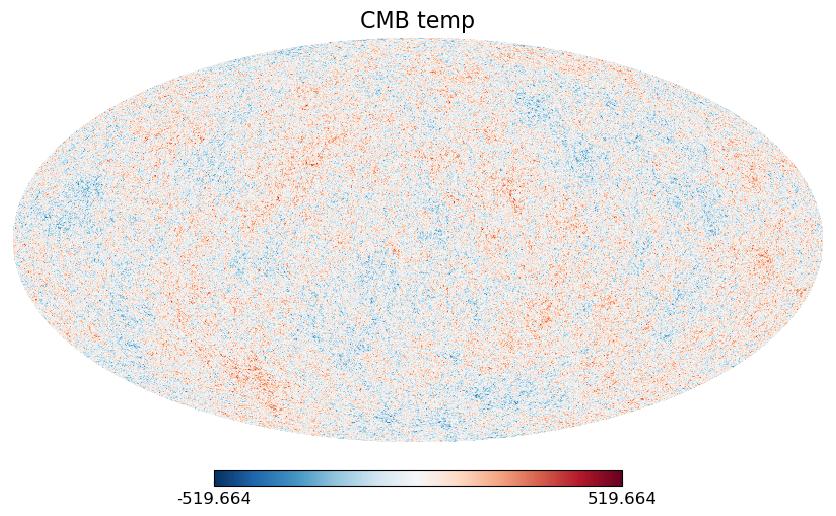

In [7]:
HT.mollview(T[:], title="CMB temp")
gcf()

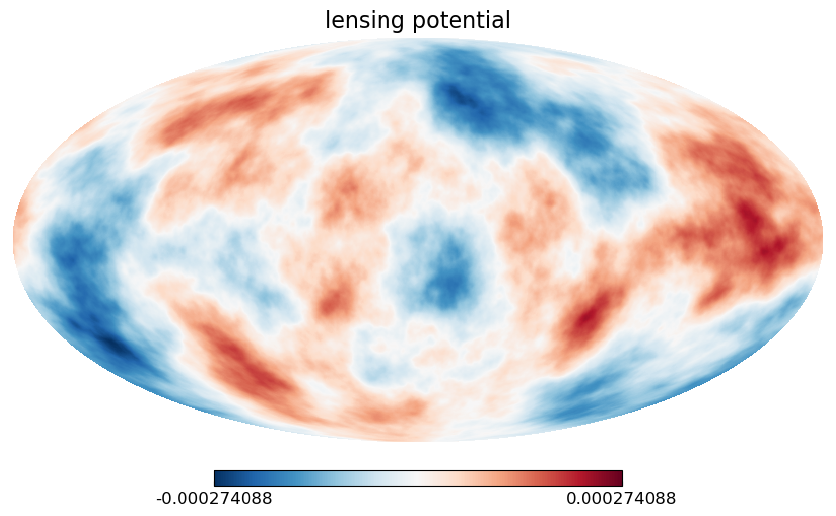

In [8]:
HT.mollview(ϕ[:], title="lensing potential")
gcf()

Testing interp of gradients on sphere for lensing
====================

In [9]:
θfull, φfull  = pix(trn)
smallθ = (θfull .< 0.025)
midθ   = (π/2-0.01) .< θfull .< (π/2+0.01)
v1_eθφ   = vϕ_on_eθφ[1][:]
v2_eθφ   = vϕ_on_eθφ[2][:]
v1_ê   = vϕ_on_ê[1][:]
v2_ê   = vϕ_on_ê[2][:];

The geodesic distance of displacement should be the similar
for all θ

In [10]:
displ_geo = function (v1, v2)
    initn̂ = HT.n̂.(θfull,φfull)
    termn̂ = HT.n̂.(θfull .+ v1, φfull .+ v2)
    .- log.(HT.α_n̂.(initn̂, termn̂))
end

#1 (generic function with 1 method)

Test vϕ_on_ê
---------------------

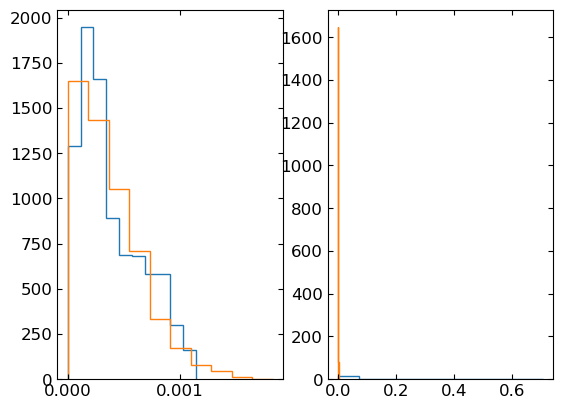

In [11]:
fig, ax = subplots(1,2)
ax[1].hist(abs.(v2_ê[smallθ]), histtype="step", density=true)
ax[1].hist(abs.(v2_ê[midθ]),   histtype="step", density=true)
ax[2].hist(abs.(v2_eθφ[smallθ]), histtype="step", density=true)
ax[2].hist(abs.(v2_eθφ[midθ]),   histtype="step", density=true)
gcf()

these look to have the same magnitude if using raw HT.∇
... which seems to imply that vϕ_on_ê are indeed weights on êθ and êφ

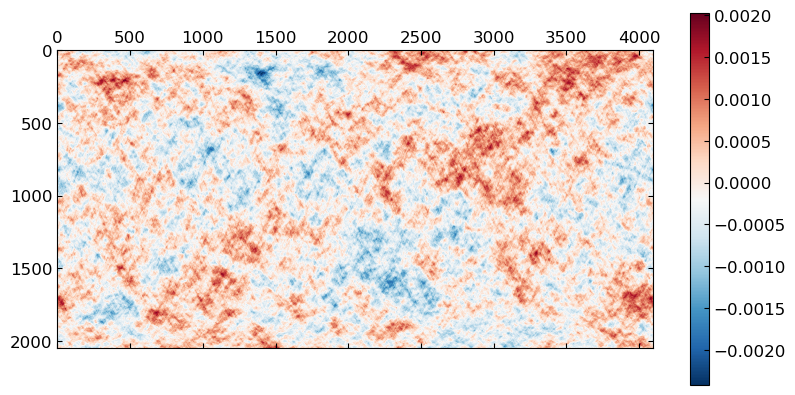

In [12]:
v1_ê |> HT.eqbelt |> matshow; colorbar(); gcf()

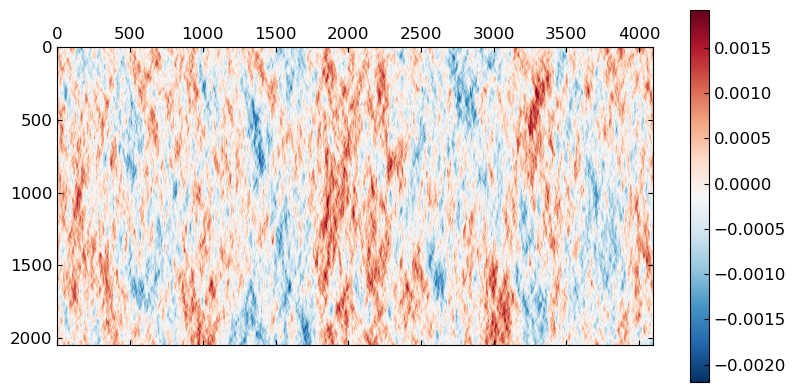

In [13]:
v2_ê |> HT.eqbelt |> matshow; colorbar(); gcf()

Test vϕ_on_eθφ
---------------------

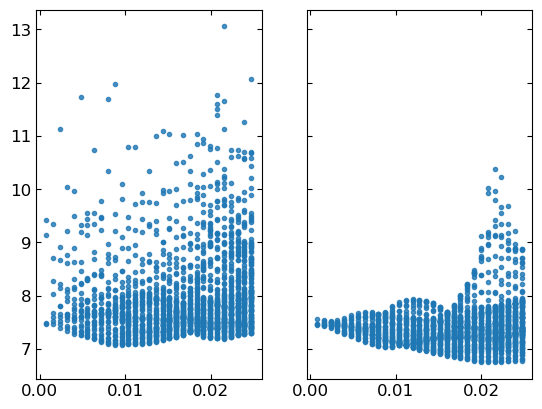

In [14]:
fig, ax = subplots(1,2, sharey=true)
displ_geo_ê   = displ_geo(v1_ê, v2_ê)
displ_geo_eθφ = displ_geo(v1_eθφ, v2_eθφ)
ax[1].plot(θfull[smallθ], displ_geo_ê[smallθ], ".", alpha = 0.8)
ax[2].plot(θfull[smallθ], displ_geo_eθφ[smallθ], ".", alpha = 0.8)
gcf()

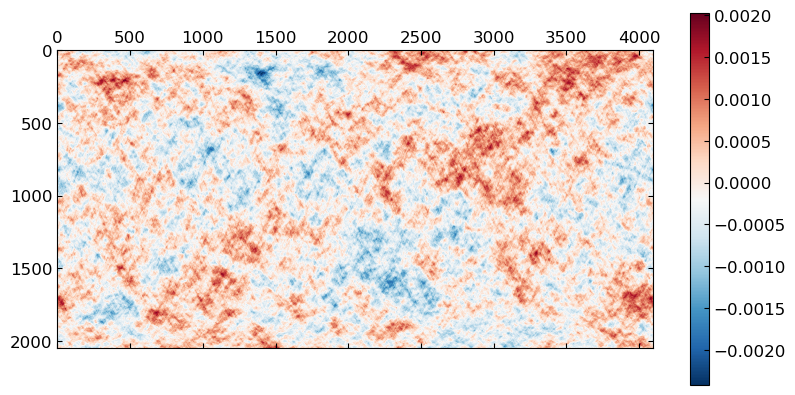

In [15]:
v1_eθφ |> HT.eqbelt |> matshow; colorbar(); gcf()

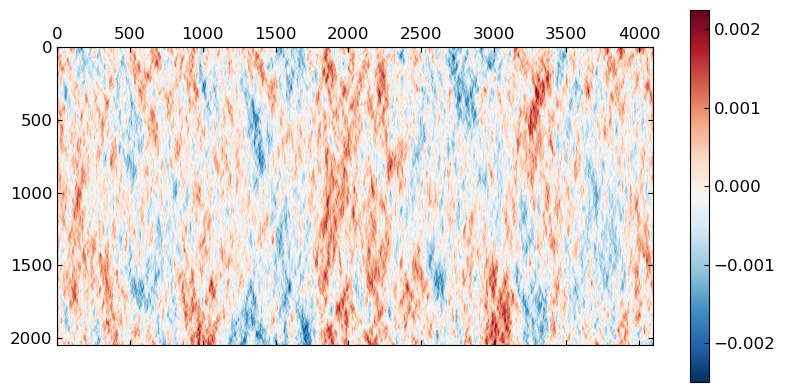

In [16]:
v2_eθφ |> HT.eqbelt |> matshow; colorbar(); gcf()

Lets check that we can get the same vϕ_on_ê, vϕ_on_eθφ on the
equitorial belt with discrete increments
====================

In [17]:
Tbelt = HT.eqbelt(T[:])
ϕbelt = HT.eqbelt(ϕ[:]);

In [18]:
v1_eθφ_belt  = HT.eqbelt(vϕ_on_eθφ[1][:])
v2_eθφ_belt  = HT.eqbelt(vϕ_on_eθφ[2][:])
v1_ê_belt  = HT.eqbelt(vϕ_on_ê[1][:])
v2_ê_belt  = HT.eqbelt(vϕ_on_ê[2][:]);

In [19]:
θbelt, φbelt = HT.pix_eqbelt(trn.nside)
sinθbelt = sin.(θbelt)
Δcosθ    = mean(diff(cos.(θbelt)))
nθ       = length(θbelt)
Δφ       = mean(diff(φbelt[:]))
nφ       = length(φbelt)
onesnφm1 = fill(1,nφ-1);

∂θ (action by left mult)

 for healpix on the equitorial belt, cos(θ) is on an even grid.

In [20]:
onesnθm1 = fill(1,nθ-1)
∂cosθ = (1 / (2Δcosθ)) * spdiagm(-1 => .-onesnθm1, 1 => onesnθm1)
∂θ = (.- sinθbelt) .* ∂cosθ # using the chain rule and -sin(θ) = (d/dθ) cosθ
∂θ[1,:] .= 0
∂θ[end,:] .= 0;

∂φᵀ (action by right mult)

In [21]:
∂φ      = spdiagm(-1 => .-onesnφm1, 1 => onesnφm1)
# for the periodic boundary conditions
∂φ[1,end] = -1
∂φ[end,1] =  1
# now as a right operator
∂φᵀ = transpose((1 / (2Δφ)) * ∂φ);
# (∂φ * f')' == ∂/∂φ f == f * ∂φᵀ

Apply these to the phi realization
----------------------------

In [22]:
∂θϕ = ∂θ * ϕbelt
∂φϕ = ϕbelt * ∂φᵀ

test_v1_eθφ_belt = ∂θϕ
test_v2_eθφ_belt = ∂φϕ ./ abs2.(sinθbelt)
test_v1_ê_belt   = ∂θϕ
test_v2_ê_belt   = ∂φϕ ./ sinθbelt;

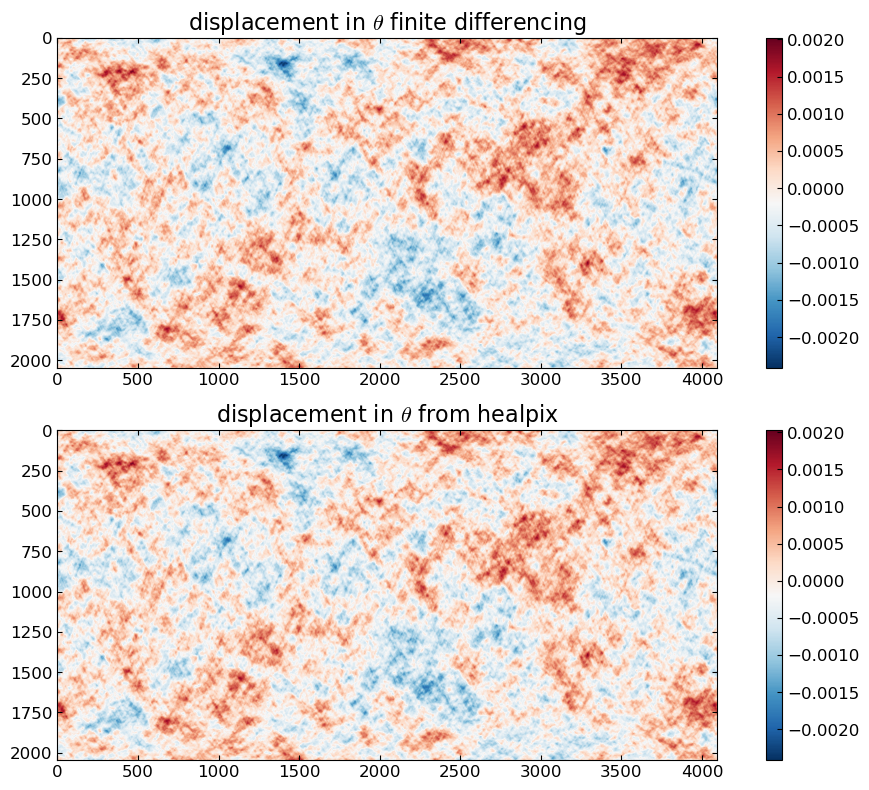

In [23]:
fig, ax = subplots(2,1, figsize=(10,8))
pcm1 = ax[1].imshow(test_v1_eθφ_belt)
pcm2 = ax[2].imshow(v1_eθφ_belt)
ax[1].set_title(L"displacement in $\theta$ finite differencing")
ax[2].set_title(L"displacement in $\theta$ from healpix")
fig.colorbar(pcm1, ax = ax[1])
fig.colorbar(pcm2, ax = ax[2])
fig.tight_layout()
gcf()

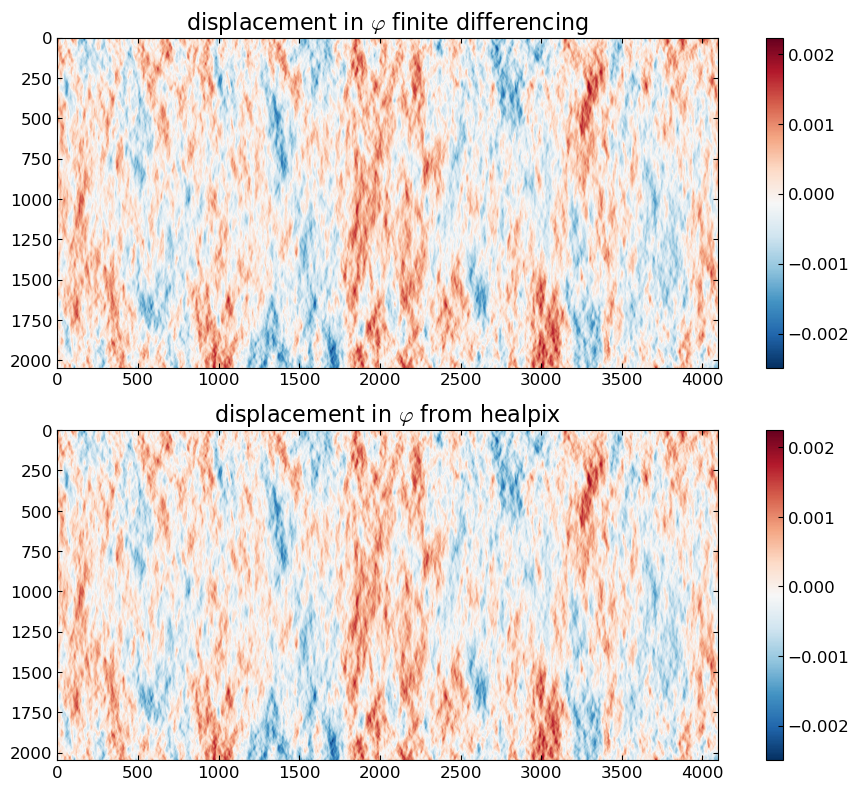

In [24]:
fig, ax = subplots(2,1, figsize=(10,8))
pcm1 = ax[1].imshow(test_v2_eθφ_belt)
pcm2 = ax[2].imshow(v2_eθφ_belt)
ax[1].set_title(L"displacement in $\varphi$ finite differencing")
ax[2].set_title(L"displacement in $\varphi$ from healpix")
fig.colorbar(pcm1, ax = ax[1])
fig.colorbar(pcm2, ax = ax[2])
fig.tight_layout()
gcf()

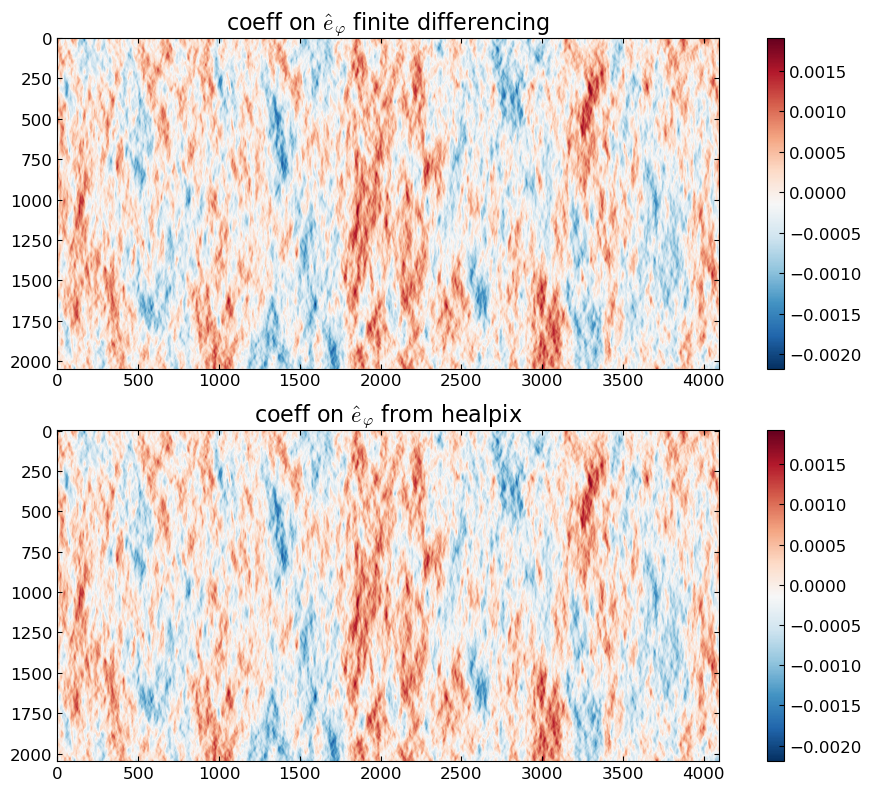

In [25]:
fig, ax = subplots(2,1, figsize=(10,8))
pcm1 = ax[1].imshow(test_v2_ê_belt)
pcm2 = ax[2].imshow(v2_ê_belt)
ax[1].set_title(L"coeff on $\hat e_{\varphi}$ finite differencing")
ax[2].set_title(L"coeff on $\hat e_{\varphi}$ from healpix")
fig.colorbar(pcm1, ax = ax[1])
fig.colorbar(pcm2, ax = ax[2])
fig.tight_layout()
gcf()

Lensing two ways: full sphere with Xlense; equitorial belt with ArrayLense
======================================

Equitorial belt with ArrayLense
======================================
To use ArrayLense we just need to define ∇!

In [26]:
struct Nabla!{Tθ,Tφ}
    ∂θ::Tθ
    ∂φᵀ::Tφ
end

function (∇!::Nabla!{Tθ,Tφ})(∇y::NTuple{2,A}, y::A) where {Tθ,Tφ,Tf,A<:Array{Tf,2}}
    mul!(∇y[1], ∇!.∂θ, y)
    mul!(∇y[2], y, ∇!.∂φᵀ)
    ∇y
end

belt displacement field

In [27]:
### The following leads to some systematics at the edges
# vϕbelt = @sblock let ϕ, ∂θ, ∂φᵀ, sinθbelt
#     ϕbelt = HT.eqbelt(ϕ[:])
#     ∂θϕ = ∂θ * ϕbelt
#     ∂φϕ = ϕbelt * ∂φᵀ
#     v1_eθφ_belt = ∂θϕ
#     v2_eθφ_belt = ∂φϕ ./ abs2.(sinθbelt)
#     (v1_eθφ_belt, v2_eθφ_belt)
# end

vϕbelt = @sblock let vϕ_on_eθφ
    (HT.eqbelt(vϕ_on_eθφ[1][:]), HT.eqbelt(vϕ_on_eθφ[2][:]))
end

([4.4687802084542895e-5 5.0316667469098205e-5 … -2.784535120064382e-6 2.1520658849041565e-5; 3.577369338016818e-5 2.9905988585574695e-5 … -1.1576389933995926e-5 1.8320613781333295e-5; … ; 0.0005189714545370121 0.0005134669629901559 … 0.0005056432663312606 0.0005180195849401248; 0.0005574759723191991 0.0005483573610044658 … 0.0005424295472371897 0.0005567505510266404], [0.0004119293016622625 0.0004848420505205415 … 0.00033296074992241625 0.0003535451702706819; 0.00042406229183754134 0.00047172588830363024 … 0.00036141746621866426 0.00037887745622988244; … ; -0.0008068904436819638 -0.0007426466842769468 … -0.0010552377215692467 -0.0009263686472743786; -0.0008135293632373895 -0.0007531199063604754 … -0.0010381040791298916 -0.0009202499649843873])

Now construct the lense

In [28]:
L = @sblock let v=vϕbelt, ∂θ, ∂φᵀ,  ∇! = Nabla!(∂θ, ∂φᵀ), nsteps=16,
    t₀ = 0
    t₁ = 1
    FL.ArrayLense(v, ∇!, t₀, t₁, nsteps)
end;

In [29]:
@time lenTbelt = L * Tbelt

 13.314714 seconds (11.38 M allocations: 1.678 GiB, 1.26% gc time)


2047×4096 Array{Float64,2}:
  -56.9122    -87.1529   -106.836    …   -55.9368       8.65073   -13.6904
  -95.3639   -114.501    -129.642       -103.13       -47.0974    -67.379
 -149.451    -140.627    -147.869       -127.847      -94.4385   -119.472
 -166.776    -177.7      -171.183       -154.829     -109.031    -146.329
 -175.886    -193.061    -172.936       -169.058     -133.991    -153.372
 -167.818    -176.151    -139.063    …  -184.928     -172.979    -169.325
 -152.169    -142.752    -110.847       -197.163     -205.259    -184.407
 -131.603     -84.9884    -57.5526      -191.494     -202.993    -186.153
  -95.7153    -20.8062      9.81521     -172.717     -175.497    -166.584
  -51.4725     19.9459     44.004       -132.129     -123.228    -119.949
    ⋮                                ⋱                              ⋮
   25.1754     13.9375    -21.5839         8.07575      5.01391    15.566
   25.7085      6.53508   -31.6605       -14.0532      12.8684     32.1711
   23.6517  

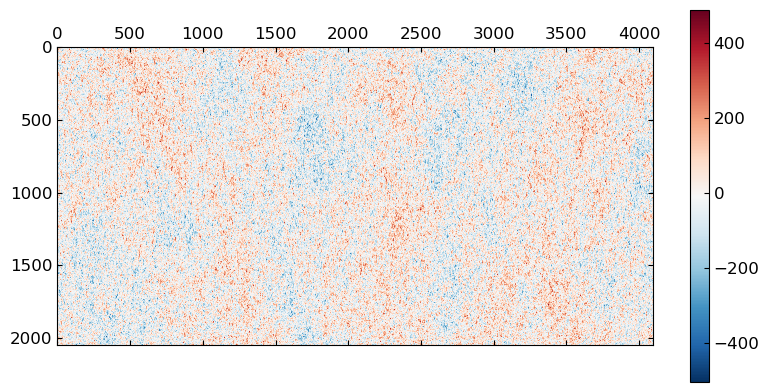

In [30]:
lenTbelt |> matshow; colorbar(); gcf()

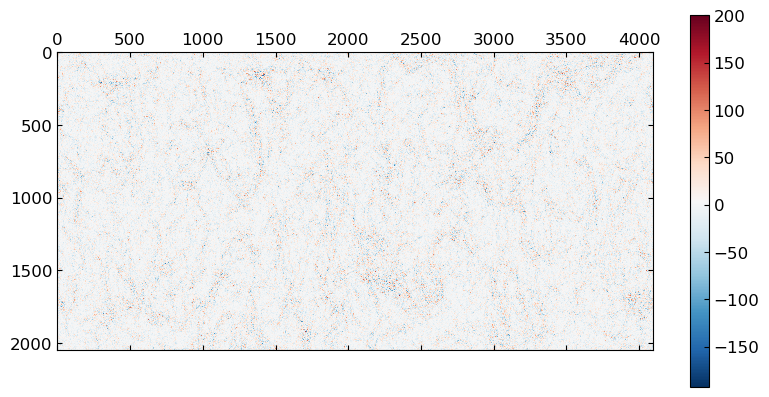

In [31]:
(lenTbelt .- Tbelt) |> matshow; colorbar(); gcf()

### Inverse Lense

In [32]:
@time Tbelt′ = L \ lenTbelt

  8.555683 seconds (7.91 k allocations: 1.125 GiB, 0.86% gc time)


2047×4096 Array{Float64,2}:
  -47.3281    -78.9664   -102.793    …   -70.3173       2.91898    -7.08214
  -87.0532   -107.797    -126.547       -115.967      -53.3383    -61.4165
 -145.14     -140.108    -148.891       -138.18       -97.557    -112.401
 -162.075    -176.762    -177.878       -166.902     -112.679    -139.228
 -170.11     -192.348    -183.664       -177.825     -139.931    -148.738
 -166.506    -178.565    -149.382    …  -187.394     -178.912    -171.726
 -157.996    -147.121    -117.596       -194.34      -208.003    -193.564
 -145.469     -93.2235    -60.275       -183.566     -199.695    -196.214
 -114.185     -32.7344     10.205       -164.072     -167.374    -173.627
  -66.7885      8.49553    43.5221      -124.034     -111.792    -119.065
    ⋮                                ⋱                              ⋮
   21.9272      6.47396   -22.5982         0.756633     8.70097    15.9059
   19.4978     -2.9092    -39.9034        -2.72332     20.7725     30.1332
   10.262

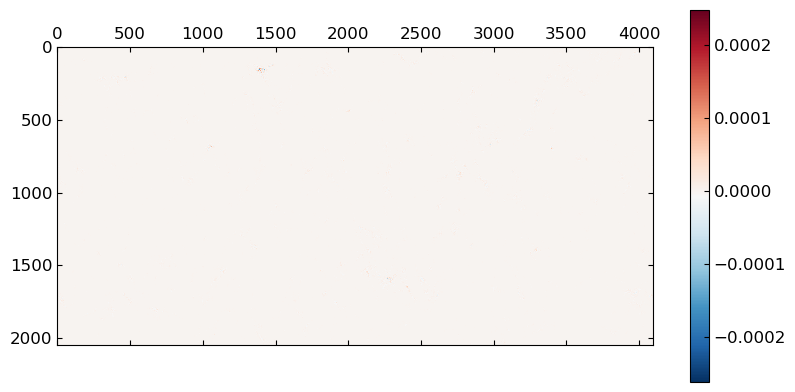

In [33]:
(Tbelt′ .- Tbelt) |> matshow; colorbar(); gcf()

Full sphere with Xlense
======================================
To use Xlense we need to define FL.plan and FL.gradient!

In [34]:
let sinθ = sin.(pix(trn)[1])

    # for ℍ0 we have Xlense{2,...,1} since it's a 2 dimensional field, stored in 1-d Array
    function FL.plan(L::Xlense{2,ℍ0,Tf,Ti,1}) where {Tf<:F64, Ti<:C64}
        szf, szi =  size_in(L.trn), size_out(L.trn)
        k     = lm(L.trn)
        vx    = tuple(L.v[1][:], L.v[2][:])

        ∇v1x = HT.∇(L.v[1][!], L.trn)[1:2]
        ∇v2x = HT.∇(L.v[2][!], L.trn)[1:2]
        ∂vx = Array{Tf,1}[Array{Tf,1}(undef,szf) for r=1:2, c=1:2]
        ∂vx[1,1] .= ∇v1x[1]
        ∂vx[2,1] .= ∇v2x[1]
        ∂vx[1,2] .= sinθ.*∇v1x[2] # extra sinθ to get d/dφ
        ∂vx[2,2] .= sinθ.*∇v2x[2] # extra sinθ to get d/dφ

        mx  = deepcopy(∂vx)
        px  = deepcopy(vx)
        ∇y  = deepcopy(vx)
        sk  = zeros(C64,szi)
        yk  = zeros(C64,szi)
        FL.XlensePlan{2,ℍ0,Tf,Ti,1}(L.trn,k,vx,∂vx,mx,px,∇y,sk,yk)
    end

    function FL.gradient!(∇y::NTuple{2,Array{F64,1}}, y::Array{F64,1}, Lp::FL.XlensePlan{2,ℍ0,F64,C64,1})
        f = Xmap(Lp.trn, y)
        ∇θf, sinθ⁻¹∇φf = HT.∇(f[!], Lp.trn)[1:2]
        ∇y[1] .= ∇θf
        ∇y[2] .= sinθ .* sinθ⁻¹∇φf
    end

end

... do the one for

Construct lense
---------------

Now construct the lense

In [35]:
L = @sblock let trn, vϕ=vϕ_on_eθφ, nsteps=16
    t₀ = 0
    t₁ = 1
    FL.Xlense(trn, vϕ, t₀, t₁, nsteps)
end;

Forward lensing
---------------

In [36]:
@time lenT = L * T;

314.011035 seconds (3.19 M allocations: 44.055 GiB, 2.78% gc time)


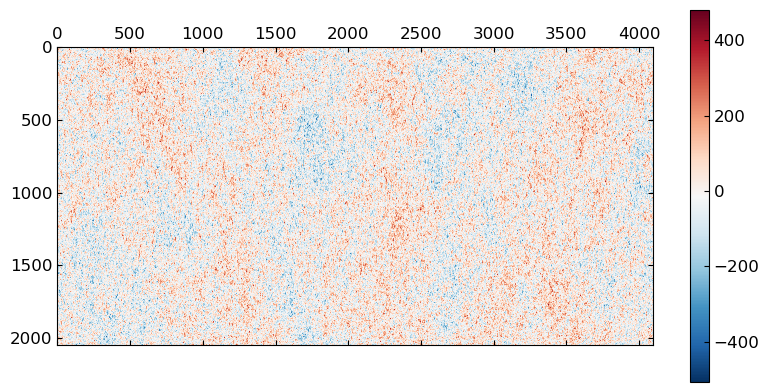

In [37]:
lenT[:] |> HT.eqbelt |> matshow; colorbar(); gcf()

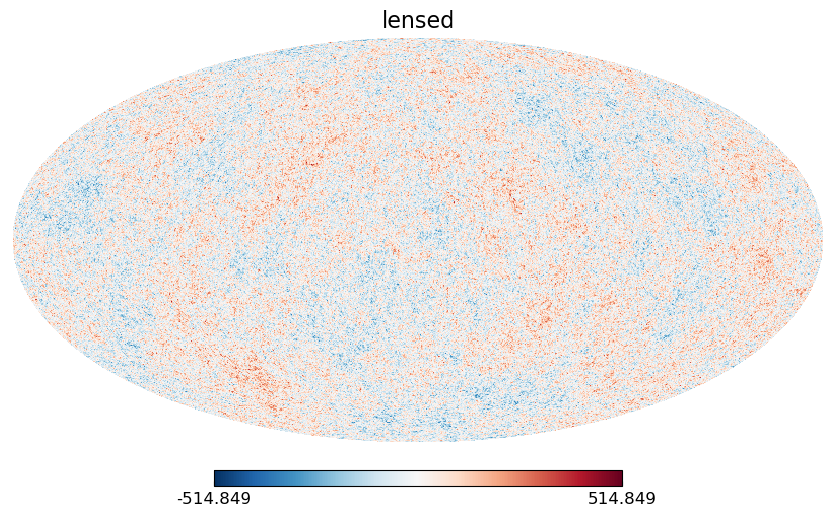

In [38]:
HT.mollview(lenT[:], title="lensed")
gcf()

Difference between lensed and un-lensed

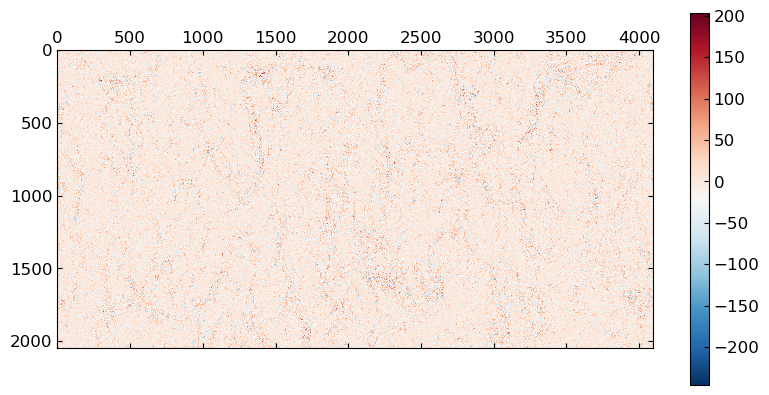

In [39]:
(T - lenT)[:] |> HT.eqbelt |> matshow; colorbar(); gcf()

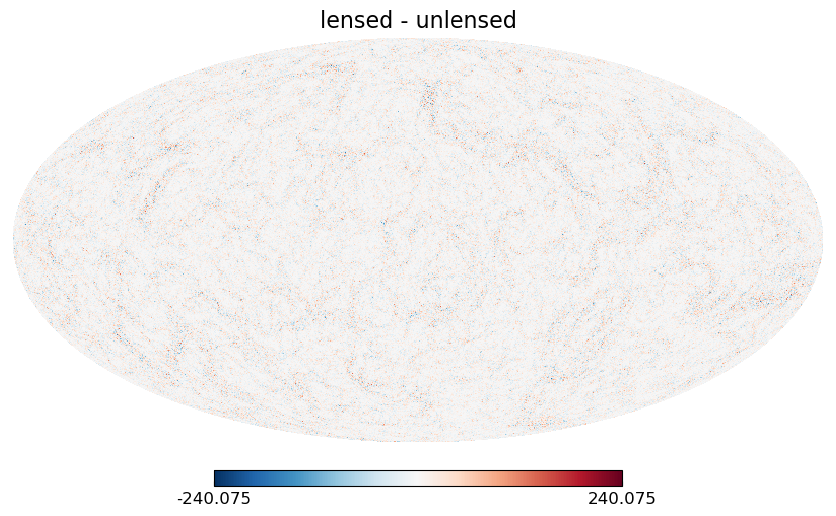

In [40]:
HT.mollview((T - lenT)[:], title="lensed - unlensed")
gcf()

Inverse lensing
---------------

In [41]:
@time T′ = L \ lenT;

335.102045 seconds (18.92 k allocations: 43.901 GiB, 2.63% gc time)


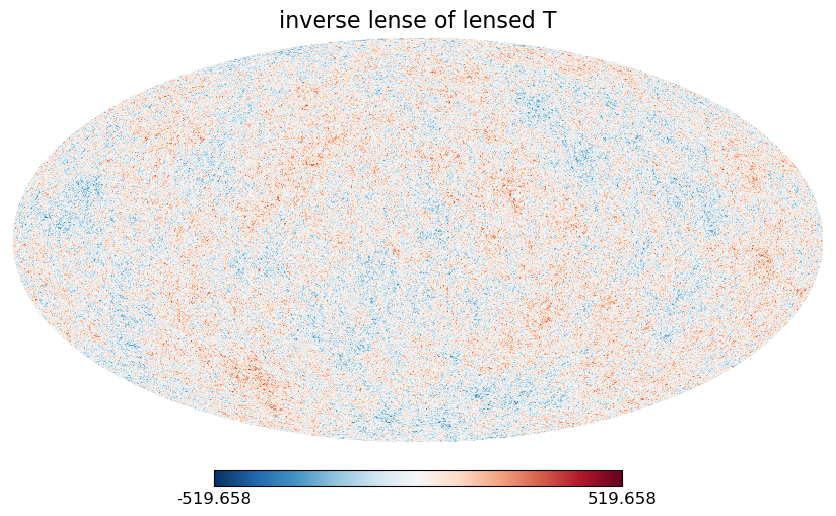

In [42]:
HT.mollview(T′[:], title="inverse lense of lensed T")
gcf()

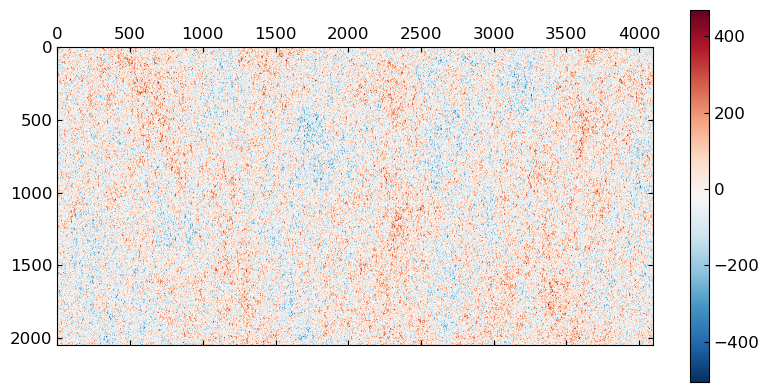

In [43]:
T′[:] |> HT.eqbelt |> matshow; colorbar(); gcf()

Difference between lensed and un-lensed

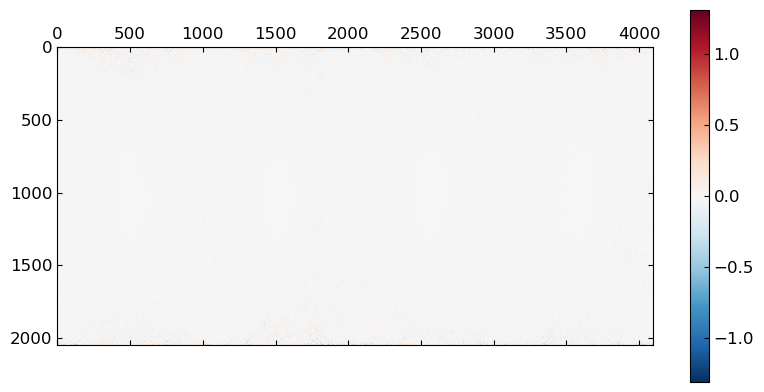

In [44]:
(T - T′)[:] |> HT.eqbelt |> matshow; colorbar(); gcf()

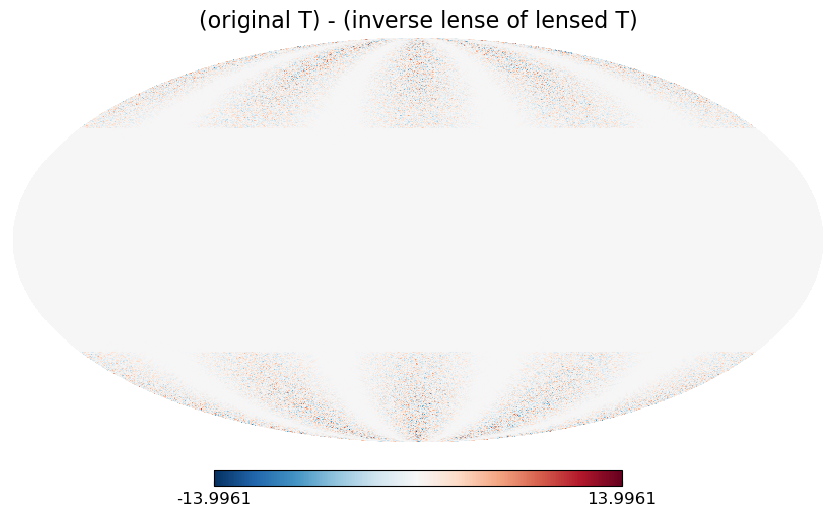

In [45]:
HT.mollview((T - T′)[:], title="(original T) - (inverse lense of lensed T)")
gcf()

Compare Equitorial belt lense to full sky lense
======================================

Here is the lensing of the eqbelt

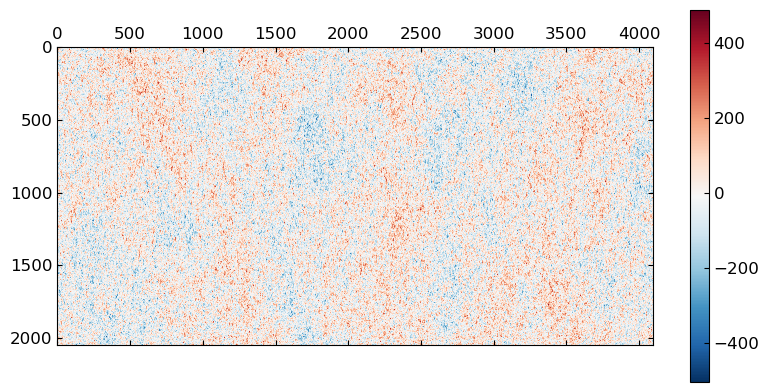

In [46]:
lenTbelt |> matshow; colorbar(); gcf()

Here is the equitorial belt of the full sky lense

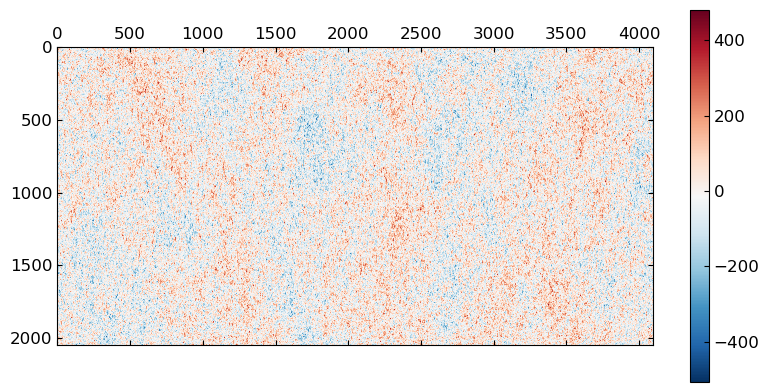

In [47]:
beltlenT = HT.eqbelt(lenT[:]);
beltlenT |> matshow; colorbar(); gcf()

Here is the difference between the two

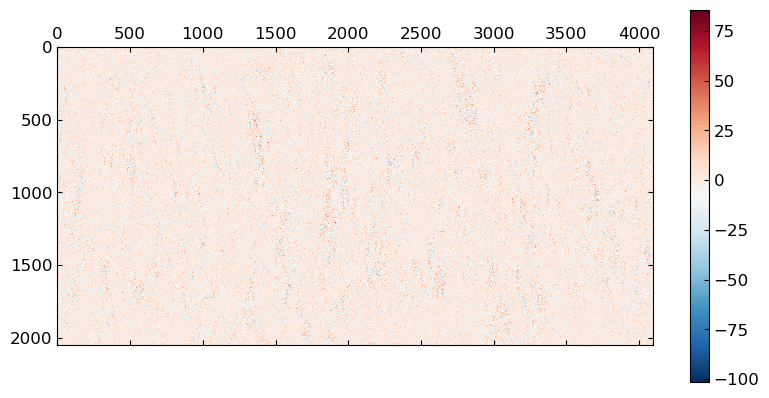

In [48]:
(lenTbelt .- beltlenT) |> matshow; colorbar(); gcf()